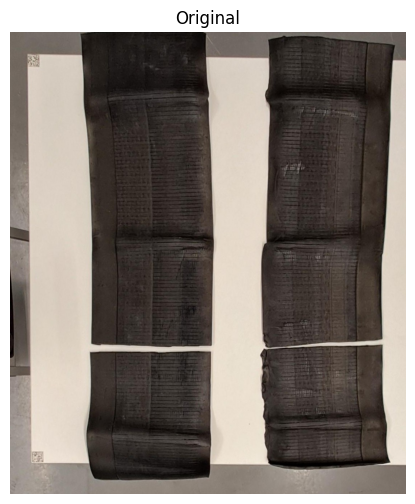

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image_path = "../../data/michelin_dataset/Multimedia (44).jpg"

img = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(6,6))
plt.imshow(img_rgb)
plt.title("Original")
plt.axis("off")
plt.show()

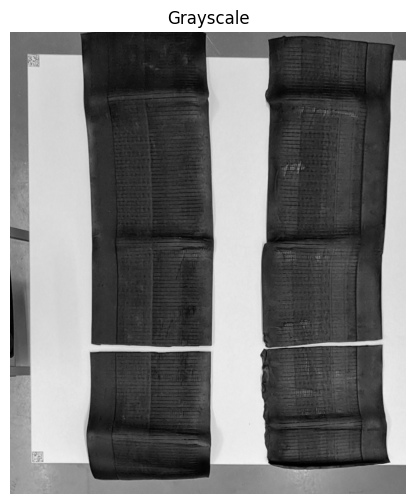

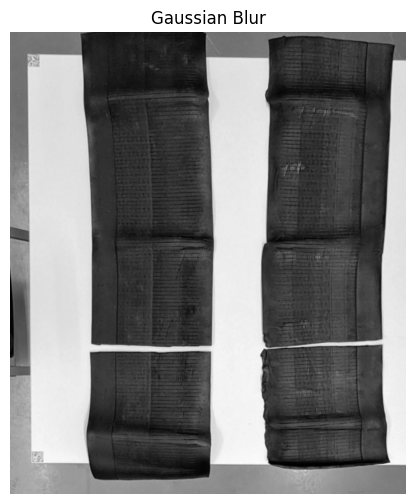

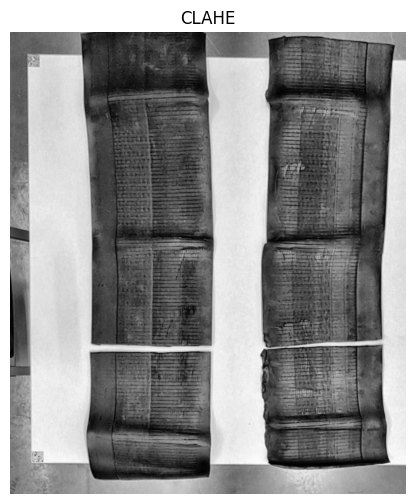

In [2]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(6,6))
plt.imshow(gray, cmap="gray")
plt.title("Grayscale")
plt.axis("off")
plt.show()

gray_blur = cv2.GaussianBlur(gray, (3, 3), 0)

plt.figure(figsize=(6,6))
plt.imshow(gray_blur, cmap="gray")
plt.title("Gaussian Blur")
plt.axis("off")
plt.show()

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
gray_clahe = clahe.apply(gray_blur)

plt.figure(figsize=(6,6))
plt.imshow(gray_clahe, cmap="gray")
plt.title("CLAHE")
plt.axis("off")
plt.show()

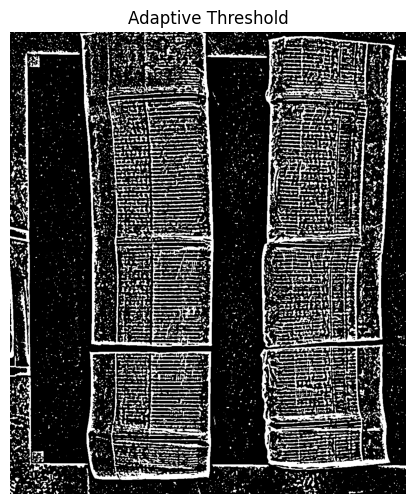

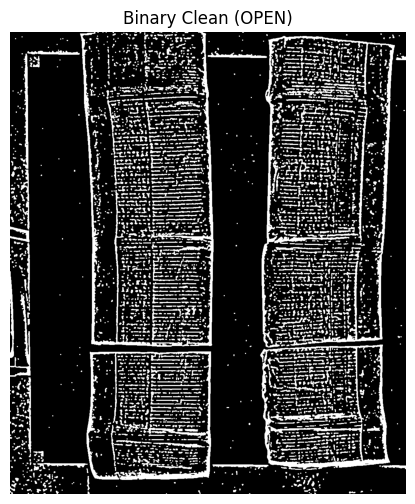

In [3]:
binary = cv2.adaptiveThreshold(
    gray_clahe,
    255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY_INV,
    31,
    5
)

plt.figure(figsize=(6,6))
plt.imshow(binary, cmap="gray")
plt.title("Adaptive Threshold")
plt.axis("off")
plt.show()

kernel = np.ones((3, 3), np.uint8)

binary_clean = cv2.morphologyEx(
    binary,
    cv2.MORPH_OPEN,
    kernel,
    iterations=1
)

plt.figure(figsize=(6,6))
plt.imshow(binary_clean, cmap="gray")
plt.title("Binary Clean (OPEN)")
plt.axis("off")
plt.show()

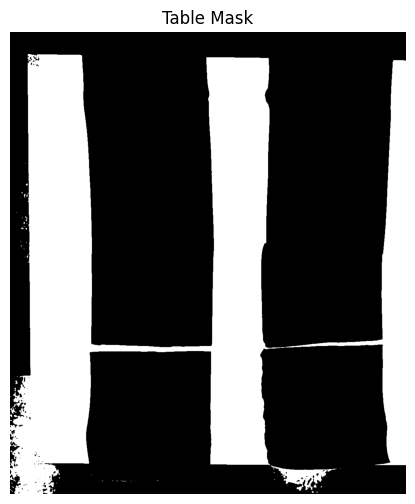

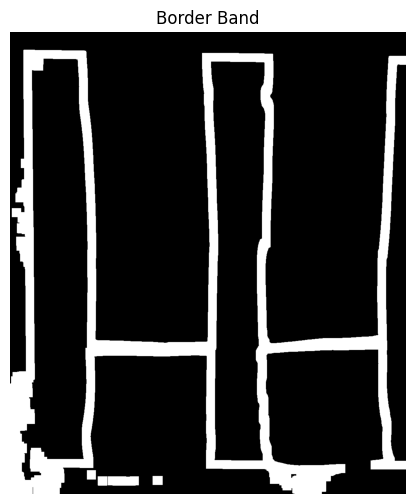

In [4]:
_, table_mask = cv2.threshold(
    gray_blur,
    150,
    255,
    cv2.THRESH_BINARY
)

plt.figure(figsize=(6,6))
plt.imshow(table_mask, cmap="gray")
plt.title("Table Mask")
plt.axis("off")
plt.show()

kernel_big = np.ones((25, 25), np.uint8)

table_dilated = cv2.dilate(table_mask, kernel_big, iterations=1)
table_eroded = cv2.erode(table_mask, kernel_big, iterations=1)

table_border_band = cv2.subtract(table_dilated, table_eroded)

plt.figure(figsize=(6,6))
plt.imshow(table_border_band, cmap="gray")
plt.title("Border Band")
plt.axis("off")
plt.show()

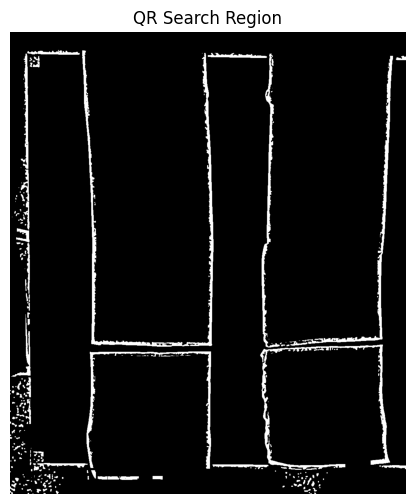

In [5]:
qr_search_region = cv2.bitwise_and(
    binary_clean,
    binary_clean,
    mask=table_border_band
)

plt.figure(figsize=(6,6))
plt.imshow(qr_search_region, cmap="gray")
plt.title("QR Search Region")
plt.axis("off")
plt.show()

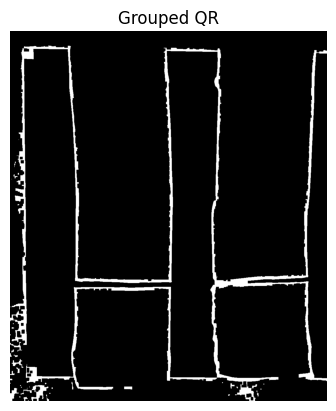

Número de contornos encontrados: 288
Fragmentos QR: 58


In [6]:
kernel_qr = np.ones((5,5), np.uint8)

qr_grouped = cv2.morphologyEx(
    qr_search_region,
    cv2.MORPH_CLOSE,
    kernel_qr,
    iterations=2
)

# Visualizar
plt.imshow(qr_grouped, cmap="gray")
plt.title("Grouped QR")
plt.axis("off")
plt.show()

contours, _ = cv2.findContours(
    qr_search_region,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE
)

print("Número de contornos encontrados:", len(contours))

small_boxes = []

for cnt in contours:
    area = cv2.contourArea(cnt)
    x, y, w_box, h_box = cv2.boundingRect(cnt)
    ratio = w_box / float(h_box)

    if 20 < area < 1000 and 0.4 < ratio < 1.8:
        small_boxes.append((x, y, w_box, h_box))

print("Fragmentos QR:", len(small_boxes))

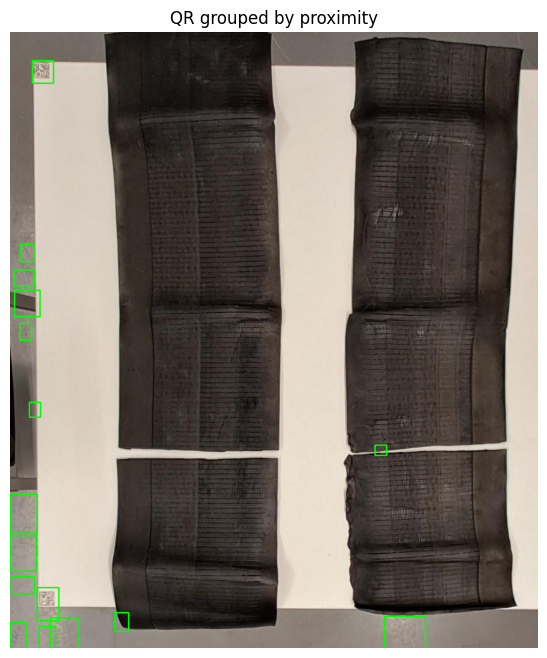

QR agrupados: 16
[(83, 1217, 60, 63), (0, 1227, 33, 53), (60, 1235, 34, 45), (778, 1214, 85, 66), (217, 1206, 29, 39), (56, 1154, 45, 69), (2, 1131, 48, 36), (0, 1041, 54, 79), (0, 960, 56, 86), (758, 858, 24, 21), (40, 769, 23, 31), (20, 605, 24, 35), (9, 536, 53, 55), (8, 494, 42, 33), (22, 441, 27, 36), (46, 59, 44, 47)]


In [7]:
result = img_rgb.copy()

qr_final = []

for x, y, w_box, h_box in small_boxes:
    cx = x + w_box // 2
    cy = y + h_box // 2

    found_group = False

    for group in qr_final:
        gx, gy, gw, gh = group

        # centro del grupo
        gcx = gx + gw // 2
        gcy = gy + gh // 2

        # si están cerca, unir cajas
        if abs(cx - gcx) < 40 and abs(cy - gcy) < 40:
            x1 = min(gx, x)
            y1 = min(gy, y)
            x2 = max(gx + gw, x + w_box)
            y2 = max(gy + gh, y + h_box)

            group[0] = x1
            group[1] = y1
            group[2] = x2 - x1
            group[3] = y2 - y1

            found_group = True
            break

    if not found_group:
        qr_final.append([x, y, w_box, h_box])

# expandir un poco cada grupo
margin = 8
qr_final_expanded = []

for x, y, w_box, h_box in qr_final:
    x1 = max(0, x - margin)
    y1 = max(0, y - margin)
    x2 = min(img.shape[1], x + w_box + margin)
    y2 = min(img.shape[0], y + h_box + margin)

    qr_final_expanded.append((x1, y1, x2 - x1, y2 - y1))
    cv2.rectangle(result, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.figure(figsize=(8, 8))
plt.imshow(result)
plt.title("QR grouped by proximity")
plt.axis("off")
plt.show()

print("QR agrupados:", len(qr_final_expanded))
print(qr_final_expanded)

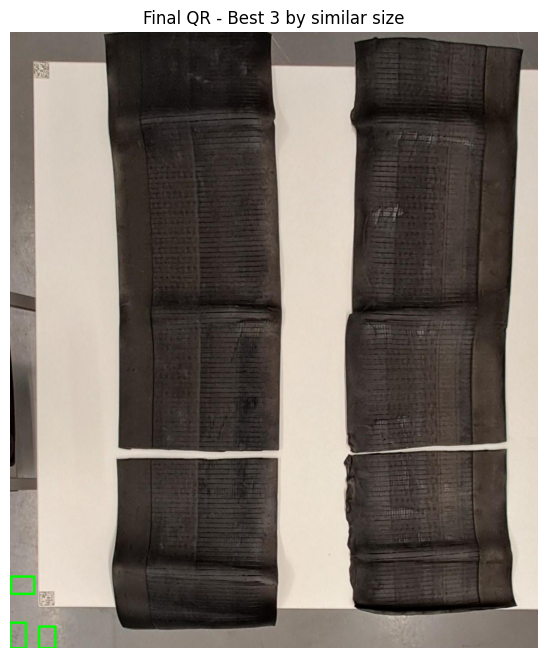

QR finales: 3
[(0, 1227, 33, 53), (60, 1235, 34, 45), (2, 1131, 48, 36)]
Score: 0.059113862118253264


In [8]:
from itertools import combinations
import numpy as np
import cv2
import matplotlib.pyplot as plt

# qr_final_expanded = lista de candidatos (x, y, w, h)

best_group = None
best_score = float("inf")

for group in combinations(qr_final_expanded, 3):
    areas = np.array([w*h for x, y, w, h in group])
    
    # Variación relativa de tamaño
    score = np.std(areas) / np.mean(areas)
    
    if score < best_score:
        best_score = score
        best_group = group

qr_filtered = list(best_group)

result_filtered = img_rgb.copy()

for x, y, w_box, h_box in qr_filtered:
    cv2.rectangle(
        result_filtered,
        (x, y),
        (x + w_box, y + h_box),
        (0, 255, 0),
        3
    )

plt.figure(figsize=(8, 8))
plt.imshow(result_filtered)
plt.title("Final QR - Best 3 by similar size")
plt.axis("off")
plt.show()

print("QR finales:", len(qr_filtered))
print(qr_filtered)
print("Score:", best_score)

In [9]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations

dataset_path = "../../data/michelin_dataset"
image_paths = sorted(glob.glob(os.path.join(dataset_path, "*.jpg")))

print("Imágenes encontradas:", len(image_paths))

Imágenes encontradas: 22


In [10]:
def detect_qrs_classic(image_path, show=False):
    img = cv2.imread(image_path)
    if img is None:
        return None, []

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h_img, w_img = img.shape[:2]

    def near_border(x, y, w_box, h_box):
        margin_border = 80
        return (
            x < margin_border or
            y < margin_border or
            x + w_box > w_img - margin_border or
            y + h_box > h_img - margin_border
        )

    # 1. Preprocesado
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.GaussianBlur(gray, (3, 3), 0)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    gray_clahe = clahe.apply(gray_blur)

    binary = cv2.adaptiveThreshold(
        gray_clahe, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY_INV,
        31, 5
    )

    kernel = np.ones((3, 3), np.uint8)
    binary_clean = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=1)

    # 2. Máscara de mesa
    _, table_mask = cv2.threshold(gray_blur, 150, 255, cv2.THRESH_BINARY)

    def inside_table(x, y, w_box, h_box):
        pad = 5

        x1 = max(0, x - pad)
        y1 = max(0, y - pad)
        x2 = min(w_img, x + w_box + pad)
        y2 = min(h_img, y + h_box + pad)

        roi_mask = table_mask[y1:y2, x1:x2]
        table_ratio = np.sum(roi_mask > 0) / roi_mask.size

        cx = x + w_box // 2
        cy = y + h_box // 2

        center_inside = table_mask[cy, cx] > 0

        return center_inside and table_ratio > 0.50

    # 3. Banda del borde
    kernel_big = np.ones((50, 50), np.uint8)
    table_dilated = cv2.dilate(table_mask, kernel_big, iterations=1)
    table_eroded = cv2.erode(table_mask, kernel_big, iterations=1)
    table_border_band = cv2.subtract(table_dilated, table_eroded)

    # 4. Región de búsqueda
    qr_search_region = cv2.bitwise_and(
        binary_clean,
        binary_clean,
        mask=table_border_band
    )

    qr_search_region_full = binary_clean.copy()

    # 5. Contornos
    contours_border, _ = cv2.findContours(qr_search_region, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours_full, _ = cv2.findContours(qr_search_region_full, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    contours = contours_border + contours_full

    small_boxes = []

    for cnt in contours:
        area = cv2.contourArea(cnt)
        x, y, w_box, h_box = cv2.boundingRect(cnt)
        ratio = w_box / float(h_box)

        if not (20 < area < 1000 and 0.4 < ratio < 1.8):
            continue

        if not near_border(x, y, w_box, h_box):
            continue

        roi = gray[y:y+h_box, x:x+w_box]
        edges = cv2.Canny(roi, 50, 150)
        edge_density = np.sum(edges > 0) / (w_box * h_box)

        if edge_density < 0.15:
            continue

        small_boxes.append((x, y, w_box, h_box))

    # 6. Agrupar por proximidad
    qr_groups = []

    for x, y, w_box, h_box in small_boxes:
        cx = x + w_box // 2
        cy = y + h_box // 2

        found_group = False

        for group in qr_groups:
            gx, gy, gw, gh = group
            gcx = gx + gw // 2
            gcy = gy + gh // 2

            if abs(cx - gcx) < 40 and abs(cy - gcy) < 40:
                x1 = min(gx, x)
                y1 = min(gy, y)
                x2 = max(gx + gw, x + w_box)
                y2 = max(gy + gh, y + h_box)

                group[0] = x1
                group[1] = y1
                group[2] = x2 - x1
                group[3] = y2 - y1

                found_group = True
                break

        if not found_group:
            qr_groups.append([x, y, w_box, h_box])

    # 7. Expandir cajas
    margin_expand = 15
    qr_expanded = []

    for x, y, w_box, h_box in qr_groups:
        if not near_border(x, y, w_box, h_box):
            continue
        
        if not inside_table(x, y, w_box, h_box):
            continue
        
        x1 = max(0, x - margin_expand)
        y1 = max(0, y - margin_expand)
        x2 = min(w_img, x + w_box + margin_expand)
        y2 = min(h_img, y + h_box + margin_expand)

        qr_expanded.append((x1, y1, x2 - x1, y2 - y1))
    
    # eliminar cajas demasiado pequeñas
    qr_expanded = [
        (x, y, w, h)
        for (x, y, w, h) in qr_expanded
        if w > 20 and h > 20
    ]

    qr_expanded = sorted(qr_expanded, key=lambda b: b[2]*b[3], reverse=True)

    # 8. Quedarse con los 3 más parecidos en tamaño
    max_qrs = 3
    qr_final = qr_expanded[:max_qrs]

    # 9. Dibujar resultado
    result = img_rgb.copy()

    for x, y, w_box, h_box in qr_final:
        cv2.rectangle(result, (x, y), (x + w_box, y + h_box), (0, 255, 0), 3)

    if show:
        plt.figure(figsize=(8, 8))
        plt.imshow(result)
        plt.title(os.path.basename(image_path))
        plt.axis("off")
        plt.show()

    return result, qr_final

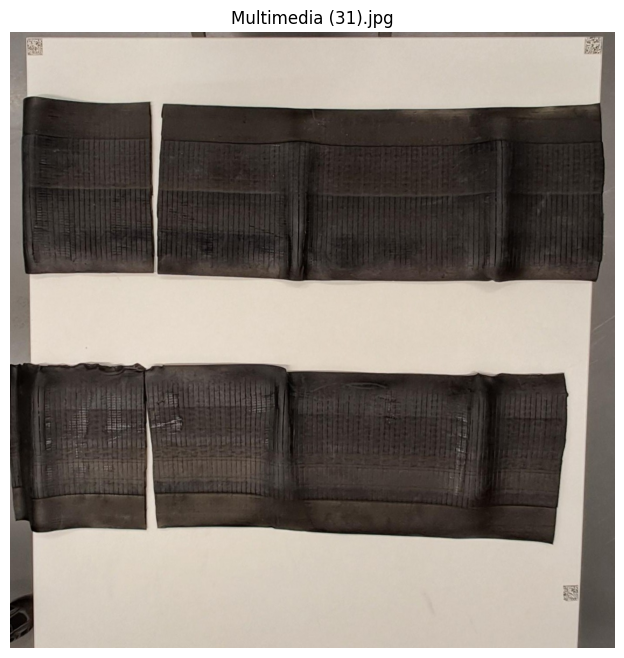

Multimedia (31).jpg -> 0 []


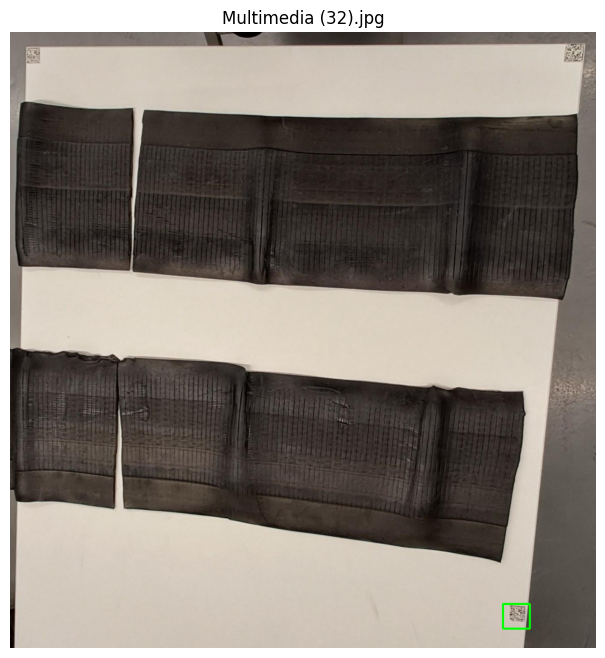

Multimedia (32).jpg -> 1 [(1158, 1344, 63, 58)]


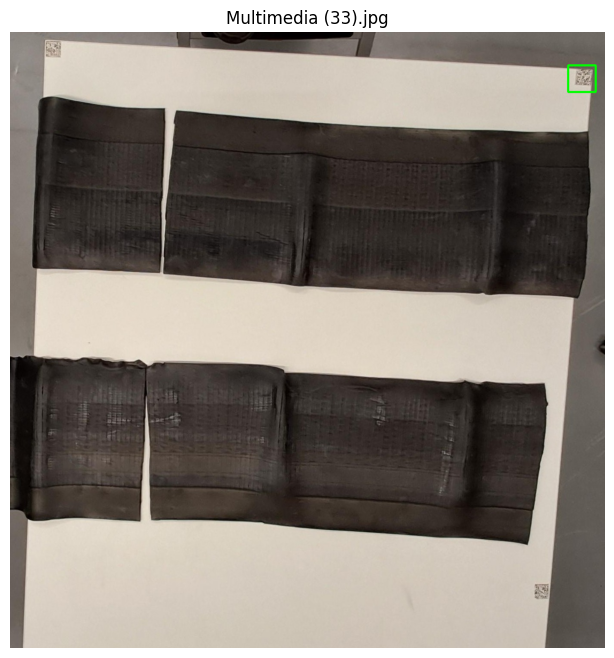

Multimedia (33).jpg -> 1 [(1295, 77, 64, 62)]


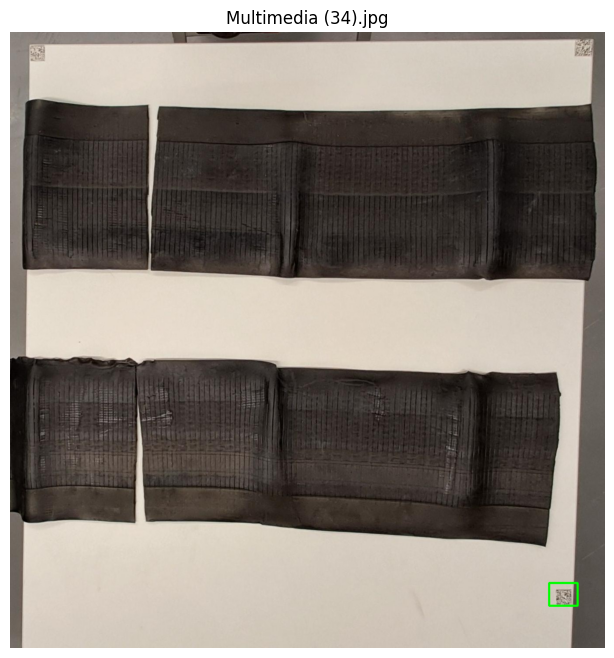

Multimedia (34).jpg -> 1 [(1231, 1258, 65, 52)]


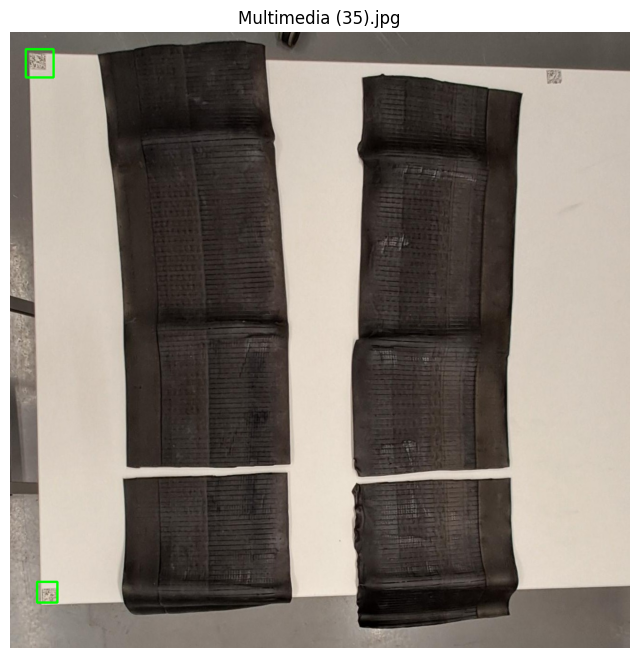

Multimedia (35).jpg -> 2 [(33, 36, 59, 60), (57, 1167, 43, 44)]


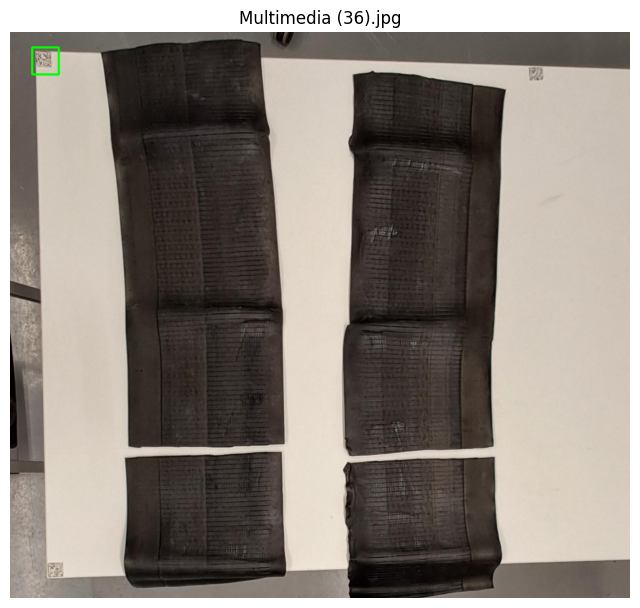

Multimedia (36).jpg -> 1 [(49, 36, 59, 60)]


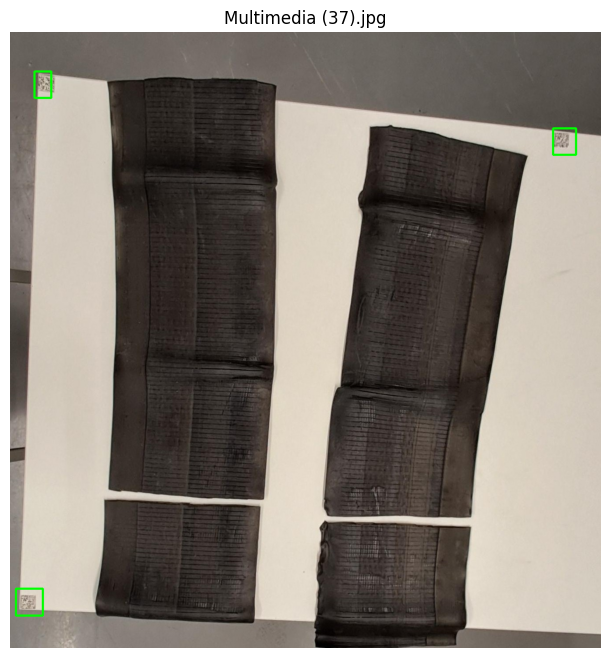

Multimedia (37).jpg -> 3 [(13, 1262, 61, 61), (1230, 218, 52, 60), (55, 89, 38, 60)]


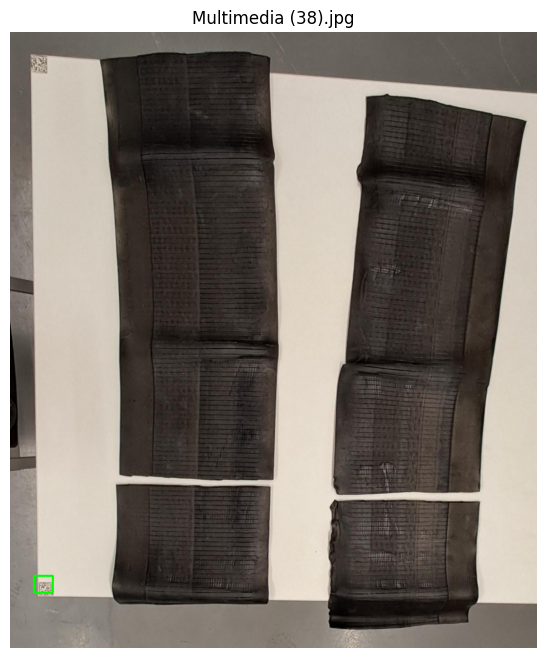

Multimedia (38).jpg -> 1 [(56, 1277, 44, 40)]


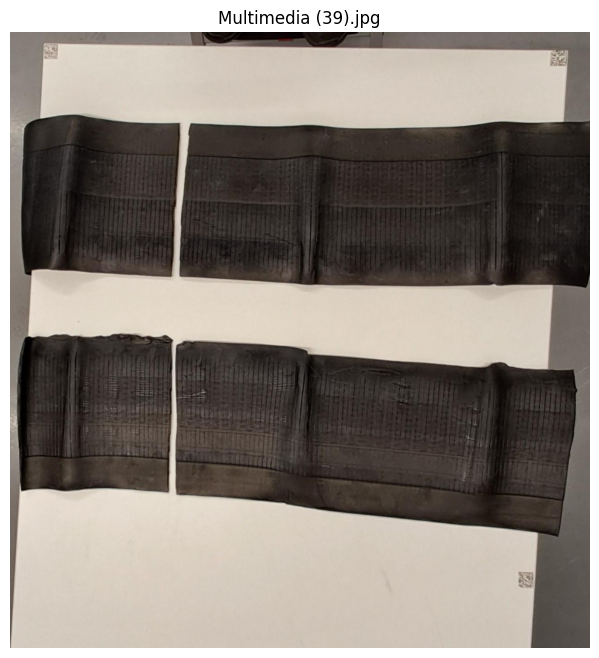

Multimedia (39).jpg -> 0 []


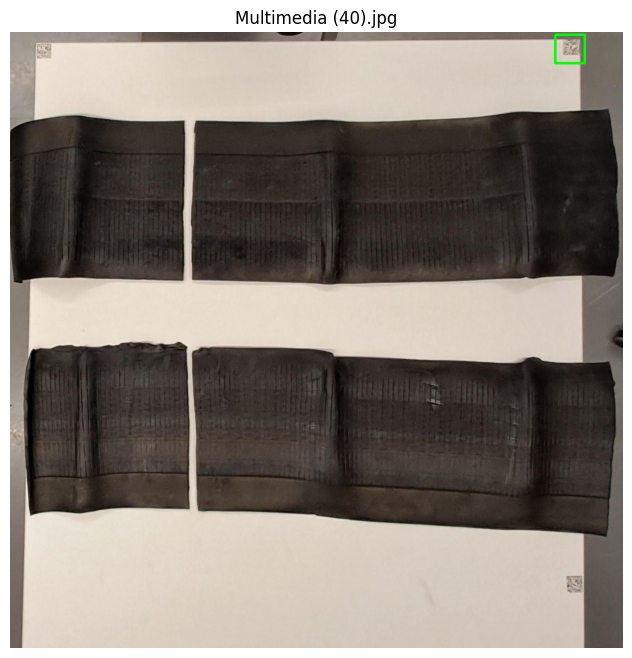

Multimedia (40).jpg -> 1 [(1091, 5, 59, 57)]


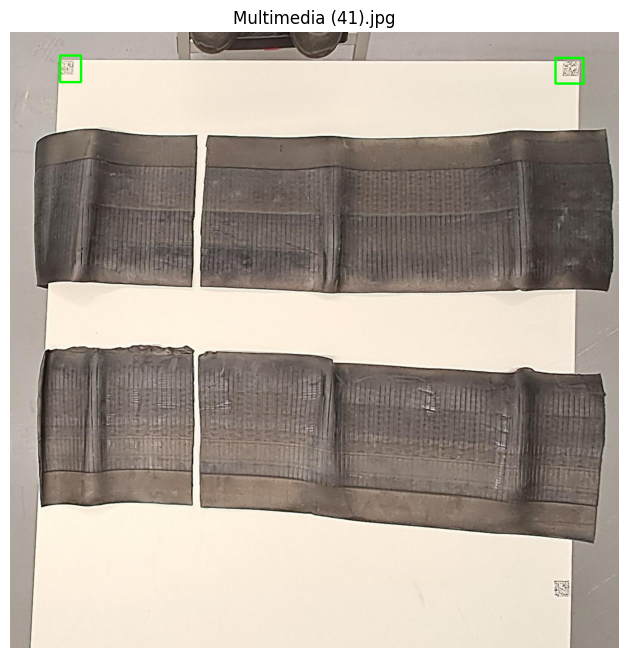

Multimedia (41).jpg -> 2 [(1147, 54, 59, 54), (105, 49, 44, 56)]


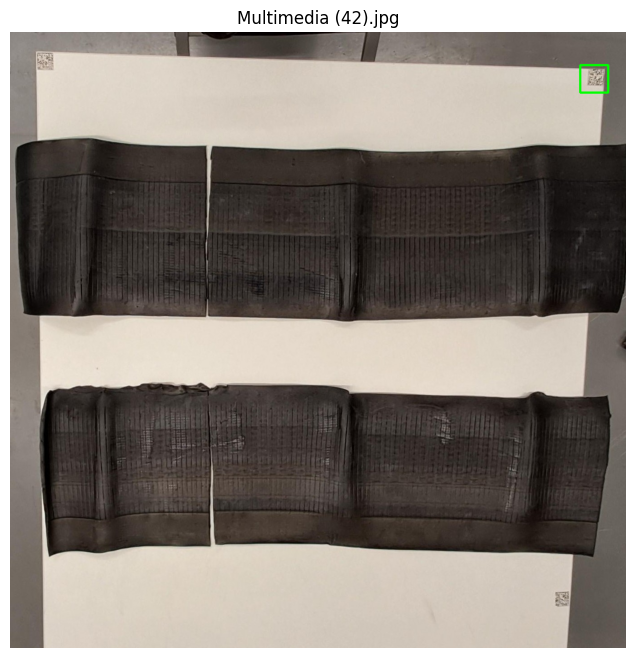

Multimedia (42).jpg -> 1 [(1265, 73, 62, 61)]


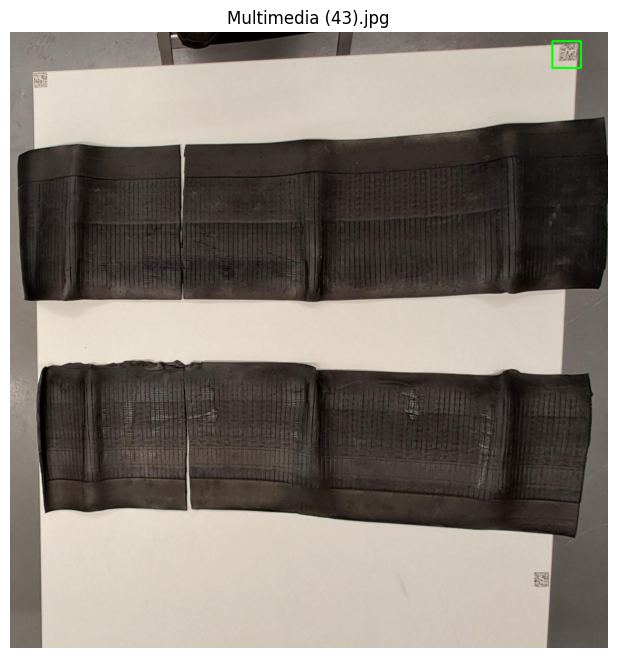

Multimedia (43).jpg -> 1 [(1272, 21, 67, 63)]


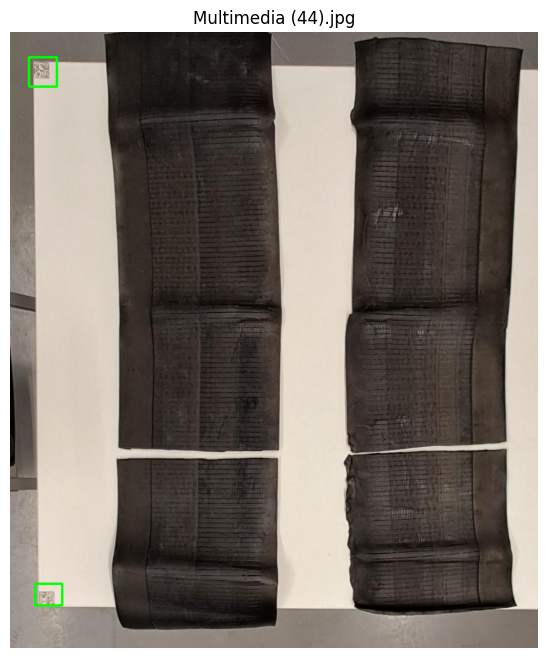

Multimedia (44).jpg -> 2 [(39, 52, 58, 61), (52, 1146, 56, 45)]


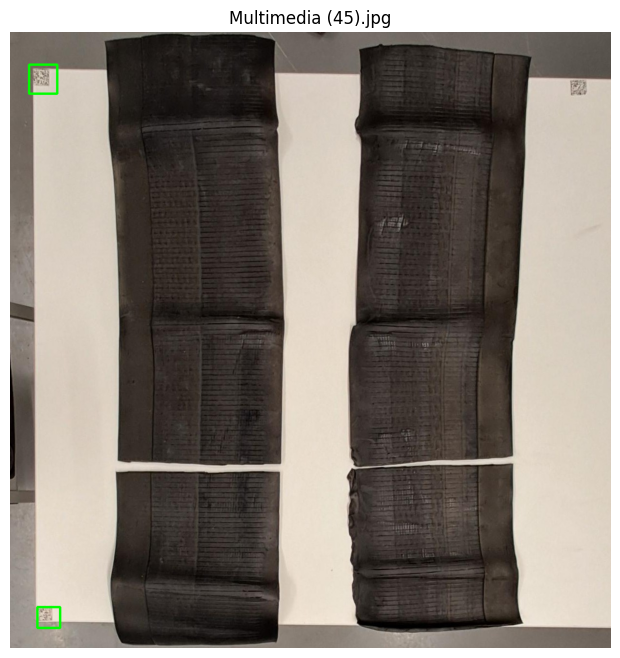

Multimedia (45).jpg -> 2 [(39, 67, 58, 60), (56, 1188, 47, 43)]


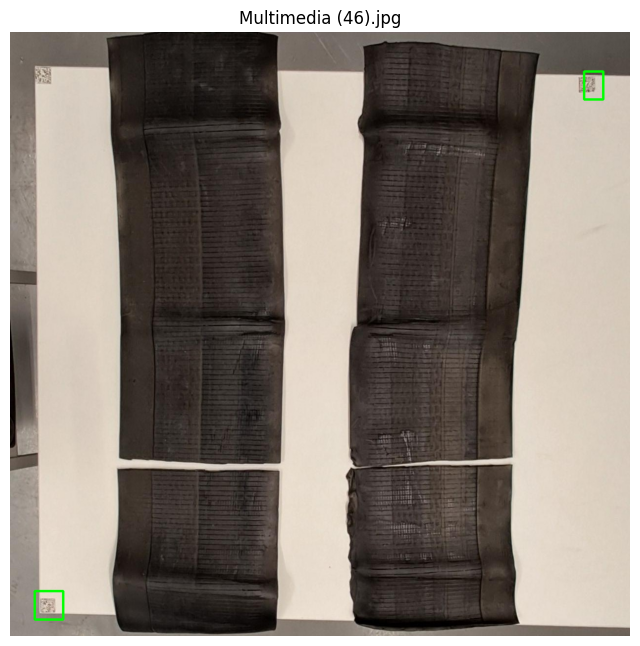

Multimedia (46).jpg -> 2 [(50, 1139, 58, 58), (1170, 80, 39, 57)]


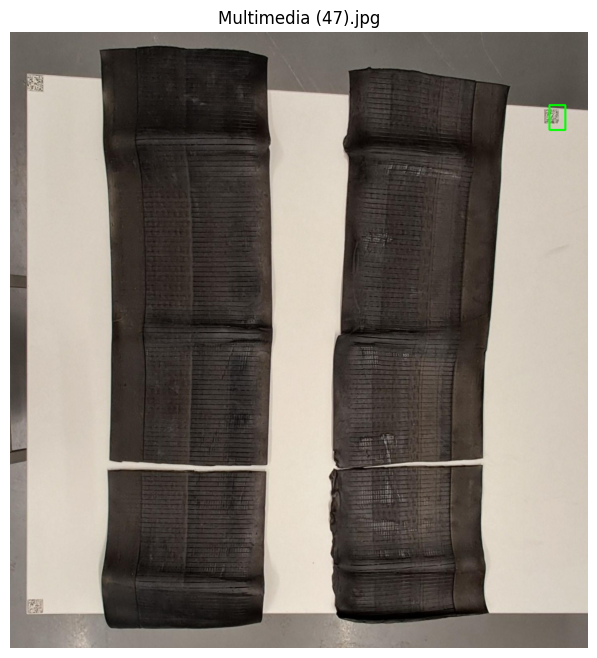

Multimedia (47).jpg -> 1 [(1323, 179, 39, 61)]


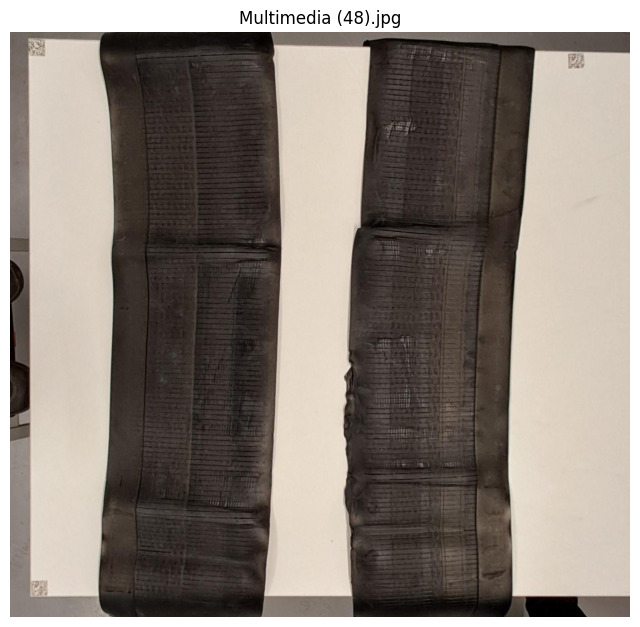

Multimedia (48).jpg -> 0 []


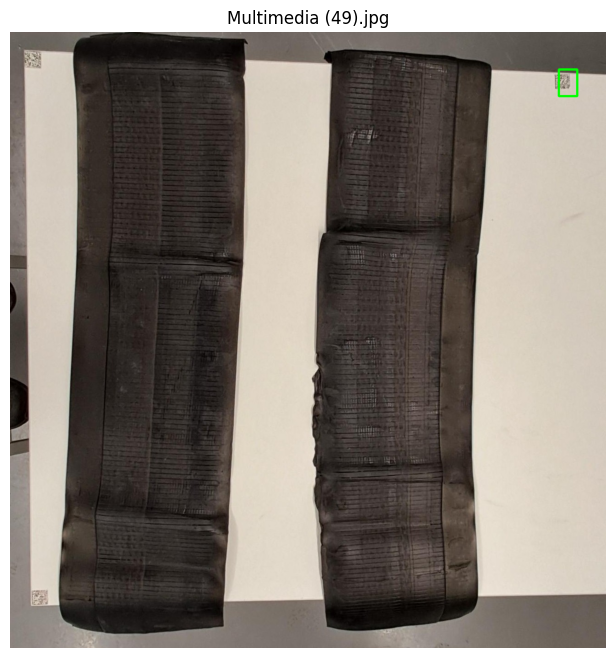

Multimedia (49).jpg -> 1 [(1193, 81, 40, 58)]


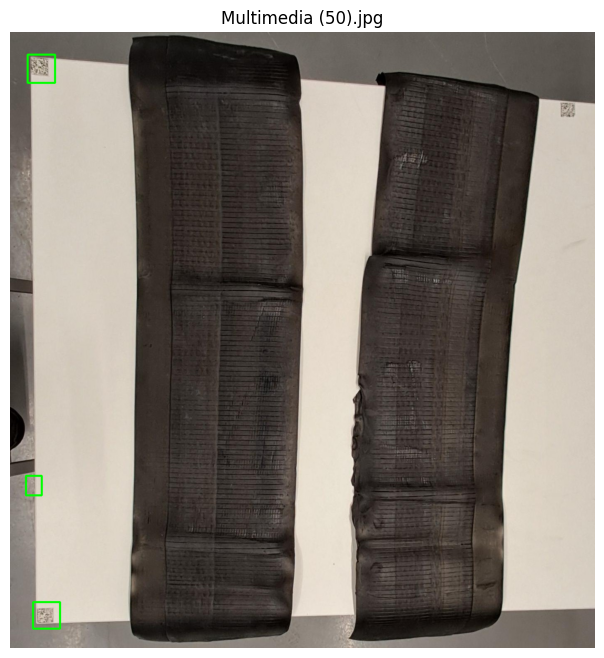

Multimedia (50).jpg -> 3 [(42, 54, 66, 68), (55, 1372, 65, 64), (38, 1068, 38, 47)]


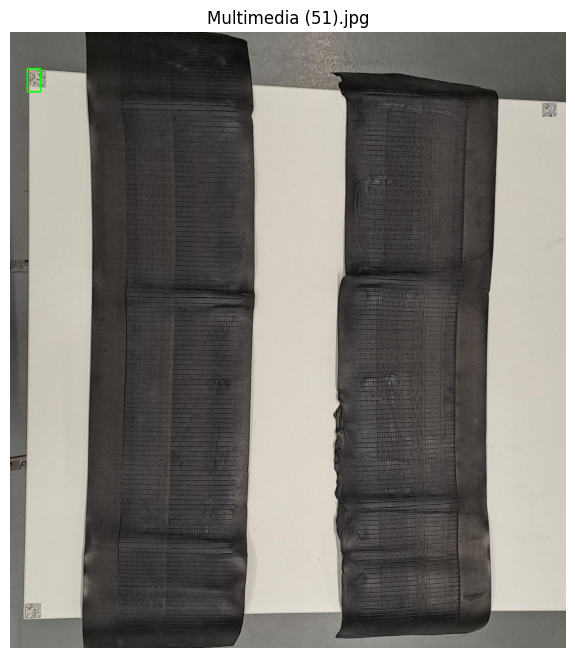

Multimedia (51).jpg -> 1 [(55, 117, 43, 74)]


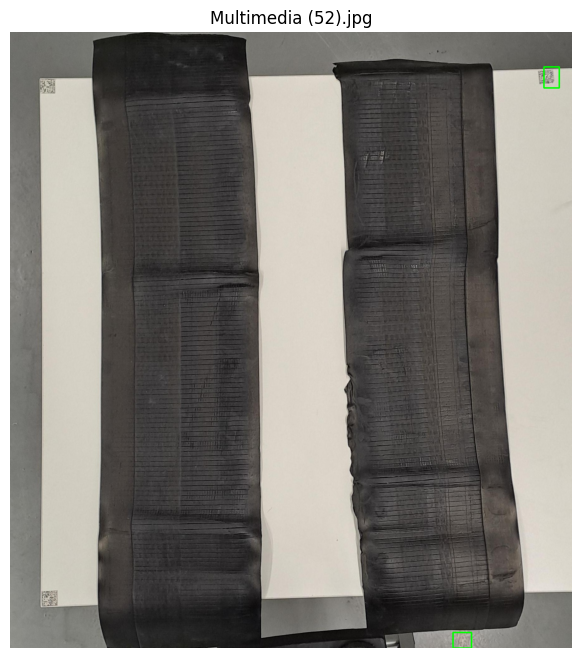

Multimedia (52).jpg -> 2 [(1703, 111, 49, 67), (1413, 1916, 59, 50)]


In [11]:
for image_path in image_paths:
    result, qrs = detect_qrs_classic(image_path, show=True)
    print(os.path.basename(image_path), "->", len(qrs), qrs)